# Kort intro til geopandas
##### GIS-brukerforum 20.04.2023

Åpne heller notebook-en her:

https://nbviewer.org/github/statisticsnorway/intro_til_geopandas/blob/main/brukerforum_20_04_2022/4_geopandas_for_GIS_folk_2.ipynb

Notebook-en kan kjøres i dapla hvis du har tilgang til kartdataene.

## Hva er geopandas?

geopandas = pandas + GIS

pandas = SAS/Excel i Python

GIS-biten er basert på de samme algoritmene som i QGIS, POSTGIS osv.

## geopandas

In [2]:
import geopandas as gpd
import pandas as pd

I geopandas starter man med å lese inn dataene sine som en GeoDataFrame.

Siden dette er dapla, må man gjennom sikkerhetsmuren. 

For eksempel med funksjonen sgis.read_geopandas:

In [ ]:
# poetry add ssb-sgis

In [3]:
# https://statisticsnorway.github.io/ssb-sgis/index.html
import sgis as sg

Advarsel: jeg kommer til å snike inn et par eksempler på sgis-funksjoner i denne geopandas-introen.

In [4]:
n5000_kommunesti = "ssb-prod-kart-data-delt/kartdata_visualisering/klargjorte-data/2022/parquet/N5000_kommune_flate_p2022_v1.parquet"

kommuner = sg.read_geopandas(n5000_kommunesti)

Vi har nå en GeoDataFrame som ser sånn ut:

In [5]:
kommuner

,OBJTYPE,NAVN,KOMMUNENR,SHAPE_Length,SHAPE_Area,geometry
0,Kommune,Alstahaug,1820,126623.728536,1.542645e+08,"MULTIPOLYGON (((393031.130 7322897.000, 392431..."
1,Kommune,Alta,5403,605644.767959,3.742475e+09,"MULTIPOLYGON (((827951.920 7819380.820, 830139..."
2,Kommune,Alvdal,3428,144895.626627,9.325153e+08,"MULTIPOLYGON (((284645.390 6883576.450, 285460..."
3,Kommune,Alver,4631,260175.662937,5.856690e+08,"MULTIPOLYGON (((-26068.640 6771499.000, -25768..."
4,Kommune,Andøy,1871,181307.687722,6.771995e+08,"MULTIPOLYGON (((522790.800 7645784.410, 519366..."
...,...,...,...,...,...,...
351,Kommune,Åmot,3422,180392.070296,1.329674e+09,"MULTIPOLYGON (((324711.900 6789915.870, 323070..."
352,Kommune,Årdal,4643,164129.187065,9.724066e+08,"MULTIPOLYGON (((134985.300 6829515.790, 134926..."
353,Kommune,Ås,3021,50204.661912,9.761353e+07,"MULTIPOLYGON (((267648.620 6616156.810, 266978..."
354,Kommune,Åseral,4224,126242.804001,8.933625e+08,"MULTIPOLYGON (((74731.020 6533507.960, 74632.4..."


Man kan gjøre alt man kan gjøre i pandas.

For eksempel velge kolonner:

In [6]:
kommuner = kommuner[["KOMMUNENR", "geometry"]]
kommuner

,KOMMUNENR,geometry
0,1820,"MULTIPOLYGON (((393031.130 7322897.000, 392431..."
1,5403,"MULTIPOLYGON (((827951.920 7819380.820, 830139..."
2,3428,"MULTIPOLYGON (((284645.390 6883576.450, 285460..."
3,4631,"MULTIPOLYGON (((-26068.640 6771499.000, -25768..."
4,1871,"MULTIPOLYGON (((522790.800 7645784.410, 519366..."
...,...,...
351,3422,"MULTIPOLYGON (((324711.900 6789915.870, 323070..."
352,4643,"MULTIPOLYGON (((134985.300 6829515.790, 134926..."
353,3021,"MULTIPOLYGON (((267648.620 6616156.810, 266978..."
354,4224,"MULTIPOLYGON (((74731.020 6533507.960, 74632.4..."


Sortere dataene:

In [7]:
kommuner = kommuner.sort_values("KOMMUNENR").reset_index(drop=True)
kommuner

,KOMMUNENR,geometry
0,0301,"MULTIPOLYGON (((260144.510 6674128.710, 260144..."
1,1101,"MULTIPOLYGON (((4261.850 6526143.700, -1387.27..."
2,1103,"MULTIPOLYGON (((-34880.796 6577351.006, -32768..."
3,1106,"MULTIPOLYGON (((-42708.190 6633182.490, -44948..."
4,1108,"MULTIPOLYGON (((34431.670 6590053.850, 40057.1..."
...,...,...
351,5440,"MULTIPOLYGON (((1038532.450 7912884.141, 10355..."
352,5441,"MULTIPOLYGON (((995555.353 7897167.787, 997023..."
353,5442,"MULTIPOLYGON (((1034332.501 7841798.000, 10341..."
354,5443,"MULTIPOLYGON (((1080981.946 7893123.122, 10779..."


### Geometrikolonnen

In [8]:
kommuner.geometry

0      MULTIPOLYGON (((260144.510 6674128.710, 260144...
1      MULTIPOLYGON (((4261.850 6526143.700, -1387.27...
2      MULTIPOLYGON (((-34880.796 6577351.006, -32768...
3      MULTIPOLYGON (((-42708.190 6633182.490, -44948...
4      MULTIPOLYGON (((34431.670 6590053.850, 40057.1...
                             ...                        
351    MULTIPOLYGON (((1038532.450 7912884.141, 10355...
352    MULTIPOLYGON (((995555.353 7897167.787, 997023...
353    MULTIPOLYGON (((1034332.501 7841798.000, 10341...
354    MULTIPOLYGON (((1080981.946 7893123.122, 10779...
355    MULTIPOLYGON (((1048047.630 7817898.500, 10479...
Name: geometry, Length: 356, dtype: geometry

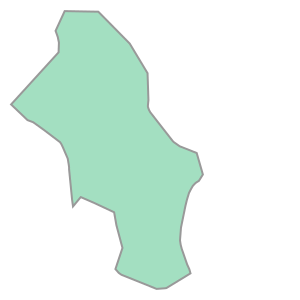

In [9]:
geometri_nr1 = kommuner.geometry.iloc[0]
geometri_nr1

Som tekst:

In [10]:
geometri_nr1.wkt

'MULTIPOLYGON (((260144.50999999978 6674128.709899999, 260144.5762 6674128.642999999, 260785.26999999955 6673481.1899, 264285.71999999974 6669927.889900001, 266635.76999999955 6666025.1599, 266750.71999999974 6662490.7399, 266679.7599999998 6661748.2399, 266678.8200000003 6661715.3599, 266680.01999999955 6661635.2399, 266724.08999999985 6661457.149900001, 266831.3099999996 6661170.619899999, 266846.45999999996 6661141.459899999, 267000.6900000004 6660865.809900001, 269933.4299999997 6657107.969900001, 270072.8799999999 6656959.7599, 270822.51999999955 6656432.1899, 270855.16000000015 6656410.129899999, 270895.0700000003 6656387.199899999, 273111.4500000002 6655508.6899, 273925.9199999999 6652676.5799, 273403.9199999999 6651840.5799, 273106.3499999996 6651660.7499, 273079.28000000026 6651644.049900001, 273012.03000000026 6651589.4899, 272923.8499999996 6651516.9299, 272876.3700000001 6651471.3399, 272636.5800000001 6651217.4399, 272584.28000000026 6651151.0899, 272314.3799999999 6650673

Geometri-kolonnen gjør det mulig å drive GIS.

### Finn areal og omkrets

In [11]:
kommuner.area

0      4.475333e+08
1      4.223231e+08
2      1.685793e+08
3      7.006131e+07
4      1.024884e+09
           ...     
351    1.121223e+09
352    3.936484e+09
353    1.436331e+09
354    1.400588e+09
355    3.834336e+09
Length: 356, dtype: float64

Omkrets/lengde:

In [12]:
kommuner.length

0      102749.011610
1      135255.315508
2      112944.145642
3       37347.017084
4      250617.641552
           ...      
351    170265.747518
352    596325.733751
353    245018.322691
354    210105.940745
355    656553.997910
Length: 356, dtype: float64

Gjør dette til kolonner:

In [13]:
kommuner["areal_km2"] = kommuner.area / 1_000_000
kommuner["omkrets_km"] = kommuner.length / 1_000
kommuner

,KOMMUNENR,geometry,areal_km2,omkrets_km
0,0301,"MULTIPOLYGON (((260144.510 6674128.710, 260144...",447.533266,102.749012
1,1101,"MULTIPOLYGON (((4261.850 6526143.700, -1387.27...",422.323119,135.255316
2,1103,"MULTIPOLYGON (((-34880.796 6577351.006, -32768...",168.579332,112.944146
3,1106,"MULTIPOLYGON (((-42708.190 6633182.490, -44948...",70.061313,37.347017
4,1108,"MULTIPOLYGON (((34431.670 6590053.850, 40057.1...",1024.883513,250.617642
...,...,...,...,...
351,5440,"MULTIPOLYGON (((1038532.450 7912884.141, 10355...",1121.223381,170.265748
352,5441,"MULTIPOLYGON (((995555.353 7897167.787, 997023...",3936.484386,596.325734
353,5442,"MULTIPOLYGON (((1034332.501 7841798.000, 10341...",1436.331129,245.018323
354,5443,"MULTIPOLYGON (((1080981.946 7893123.122, 10779...",1400.587911,210.105941


In [14]:
kommuner.explore("areal_km2", scheme="fisherjenks")

/home/jovyan/arealrek/.venv/lib/python3.10/site-packages/mapclassify/classifiers.py:1860: UserWarning: Numba not installed. Using slow pure python version.
  warnings.warn(


### Buffer
Bufre med 5000 meter:

In [15]:
bufret = kommuner.buffer(5_000)

bufret.explore()

### Dissolve

Dette samler alle geometrier:

In [16]:
alt_samlet = kommuner.dissolve()
alt_samlet

,geometry,KOMMUNENR,areal_km2,omkrets_km
0,"MULTIPOLYGON (((-28060.000 6510593.000, -28660...",0301,447.533266,102.749012


Resten av kolonnene har fått verdiene til første rad, som var Oslo.

Dette kan endres med aggfunc-parametret.

Man kan også velge hvilke kolonner man vil gruppere etter.

Samle fylkene og summerer areal og omkrets:

In [17]:
kommuner["FYLKE"] = kommuner.KOMMUNENR.str[:2]

dissolvet_fylkevis = kommuner.dissolve(by="FYLKE", aggfunc="sum", as_index=False)

dissolvet_fylkevis

/home/jovyan/arealrek/.venv/lib/python3.10/site-packages/geopandas/geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


,FYLKE,geometry,areal_km2,omkrets_km
0,03,"POLYGON ((260144.510 6674128.710, 260144.576 6...",447.533266,102.749012
1,11,"MULTIPOLYGON (((-31360.030 6512993.000, -31660...",9064.737960,2409.416323
2,15,"MULTIPOLYGON (((60831.830 6915698.500, 61831.8...",13564.123317,3666.060141
3,18,"MULTIPOLYGON (((408459.067 7218088.531, 407669...",36298.777400,8557.362610
4,30,"MULTIPOLYGON (((219489.620 6605766.880, 219508...",24549.405915,4901.367799
5,34,"POLYGON ((289321.271 6724845.038, 288287.080 6...",52098.486046,7534.858058
6,38,"MULTIPOLYGON (((178681.720 6539094.260, 177784...",17366.955002,2923.952001
7,42,"MULTIPOLYGON (((33567.050 6461428.347, 34762.2...",16277.028900,3406.533566
8,46,"MULTIPOLYGON (((-42708.733 6633182.763, -43969...",32413.199663,7558.132572
9,50,"MULTIPOLYGON (((239231.040 6928619.440, 239187...",40995.511601,6503.652303


In [18]:
dissolvet_fylkevis.explore("areal_km2")

## Punktdata

Leser bygningspunkter for Oslo og Kongsvinger.

In [19]:
bygningspunktsti = "ssb-prod-kart-data-delt/kartdata_analyse/klargjorte-data/2022/SMAT_bygg_punkt_p2022_v1.parquet"

bygg = sg.read_geopandas(
    bygningspunktsti,
    # man kan filtrere rader med en SQL-spørring. Med en litt kinkig syntax
    filters=[("KOMMUNENR", "in", ("0301", "3401"))],
    columns=["BYGNNR", "KOMMUNENR", "geometry"]
)

bygg

,BYGNNR,KOMMUNENR,geometry
2295777,081066787,0301,POINT (266589.000 6638437.000)
2295778,081690324,0301,POINT (266732.000 6638437.000)
2295785,080416237,0301,POINT (268985.000 6638438.000)
2295807,081496277,0301,POINT (268630.000 6638490.000)
2295816,081222126,0301,POINT (266745.000 6638491.000)
...,...,...,...
2829598,152033311,3401,POINT (334172.000 6694149.000)
2829599,152033338,3401,POINT (334187.000 6694149.000)
2829613,152069472,3401,POINT (337419.000 6694152.000)
2829620,018749718,3401,POINT (333568.000 6694153.000)


In [21]:
bygg.geometry

2295777    POINT (266589.000 6638437.000)
2295778    POINT (266732.000 6638437.000)
2295785    POINT (268985.000 6638438.000)
2295807    POINT (268630.000 6638490.000)
2295816    POINT (266745.000 6638491.000)
                        ...              
2829598    POINT (334172.000 6694149.000)
2829599    POINT (334187.000 6694149.000)
2829613    POINT (337419.000 6694152.000)
2829620    POINT (333568.000 6694153.000)
2829621    POINT (353158.000 6694153.000)
Name: geometry, Length: 151925, dtype: geometry

## Spatial join: koble data basert på geografisk overlapp

Nå vil jeg gi byggene kommunenummer ved å gjøre en sjoin (spatial join) med kommuneflatene.

Inner-join er default, men jeg vil ha left, altså at man beholder også bygg utenfor kommuneflatene.

In [22]:
koblet = bygg.sjoin(kommuner, how="left")
koblet

,BYGNNR,KOMMUNENR_left,geometry,index_right,KOMMUNENR_right,areal_km2,omkrets_km,FYLKE
2295777,081066787,0301,POINT (266589.000 6638437.000),0.0,0301,447.533266,102.749012,03
2295778,081690324,0301,POINT (266732.000 6638437.000),0.0,0301,447.533266,102.749012,03
2295785,080416237,0301,POINT (268985.000 6638438.000),0.0,0301,447.533266,102.749012,03
2295807,081496277,0301,POINT (268630.000 6638490.000),0.0,0301,447.533266,102.749012,03
2295816,081222126,0301,POINT (266745.000 6638491.000),0.0,0301,447.533266,102.749012,03
...,...,...,...,...,...,...,...,...
2829598,152033311,3401,POINT (334172.000 6694149.000),142.0,3401,1034.728702,162.429301,34
2829599,152033338,3401,POINT (334187.000 6694149.000),142.0,3401,1034.728702,162.429301,34
2829613,152069472,3401,POINT (337419.000 6694152.000),142.0,3401,1034.728702,162.429301,34
2829620,018749718,3401,POINT (333568.000 6694153.000),142.0,3401,1034.728702,162.429301,34


Byggene hadde allerede kommunenummer...

Legg merke til at den nye kolonnen (KOMMUNENR_right) ikke er helt god, siden kommuneflatene er altfor grovt tegnet.

La oss undersøke begge GeoDataFrame-ene samtidig med sgis.explore.

In [23]:
koblet_sample = koblet.sample(5_000)

sg.explore(kommuner, koblet_sample, "KOMMUNENR_right")

Så ikke bruk disse dataene til noe annet enn visualisering!

## Spatial join nearest
Fungerer som sjoin, bare at man  finner nærmeste geometri.

La oss finne avstand fra byggene til Troms og Finnmark.

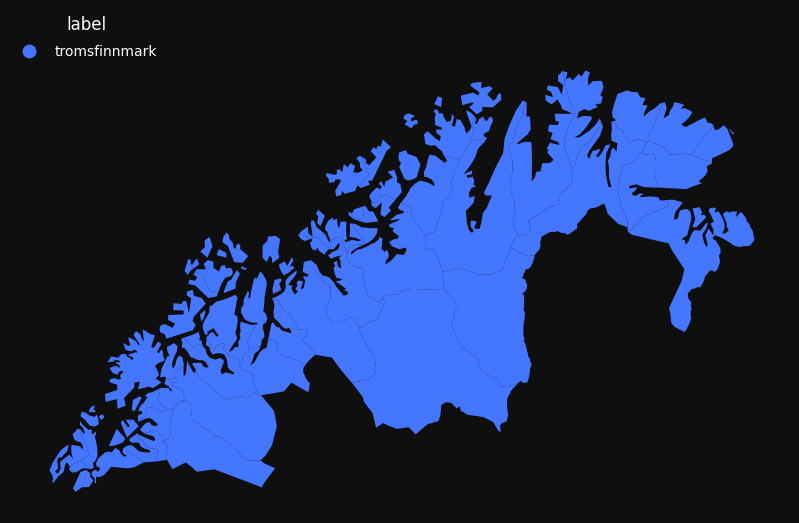

In [24]:
tromsfinnmark = kommuner.loc[kommuner.KOMMUNENR.str.startswith("54")]
sg.qtm(tromsfinnmark)

In [25]:
koblet = bygg.sjoin_nearest(
    tromsfinnmark,
    distance_col="meter_til_tromsfinnmark",
)

koblet

,BYGNNR,KOMMUNENR_left,geometry,index_right,KOMMUNENR_right,areal_km2,omkrets_km,FYLKE,meter_til_tromsfinnmark
2295777,081066787,0301,POINT (266589.000 6638437.000),324,5412,775.517495,244.678501,54,988794.096509
2295778,081690324,0301,POINT (266732.000 6638437.000),324,5412,775.517495,244.678501,54,988753.643834
2295785,080416237,0301,POINT (268985.000 6638438.000),324,5412,775.517495,244.678501,54,988117.855200
2295807,081496277,0301,POINT (268630.000 6638490.000),324,5412,775.517495,244.678501,54,988167.666063
2295816,081222126,0301,POINT (266745.000 6638491.000),324,5412,775.517495,244.678501,54,988698.171834
...,...,...,...,...,...,...,...,...,...
2829598,152033311,3401,POINT (334172.000 6694149.000),324,5412,775.517495,244.678501,54,917548.433965
2829599,152033338,3401,POINT (334187.000 6694149.000),324,5412,775.517495,244.678501,54,917544.965077
2829613,152069472,3401,POINT (337419.000 6694152.000),324,5412,775.517495,244.678501,54,916800.031491
2829620,018749718,3401,POINT (333568.000 6694153.000),324,5412,775.517495,244.678501,54,917684.416374


In [26]:
koblet_sample = koblet.sample(5_000)
sg.explore(koblet_sample, "meter_til_tromsfinnmark")

Med motsatt rekkefølge i sjoin_nearest, får vi finnmarkskommunenes avstand til nærmeste bygg:

In [27]:
koblet_motsatt = tromsfinnmark.sjoin_nearest(
    bygg,
    distance_col="meter_til_bygg",
)

<Axes: >

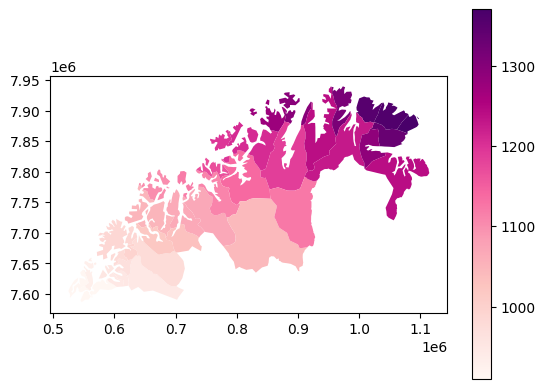

In [28]:
koblet_motsatt["km_til_bygg"] = koblet_motsatt.meter_til_bygg / 1000

koblet_motsatt.plot("km_til_bygg", cmap="RdPu", legend=True)

La oss legge merke til hvor stygt det kartet ble.

Her er en mer fleksibel løsning:

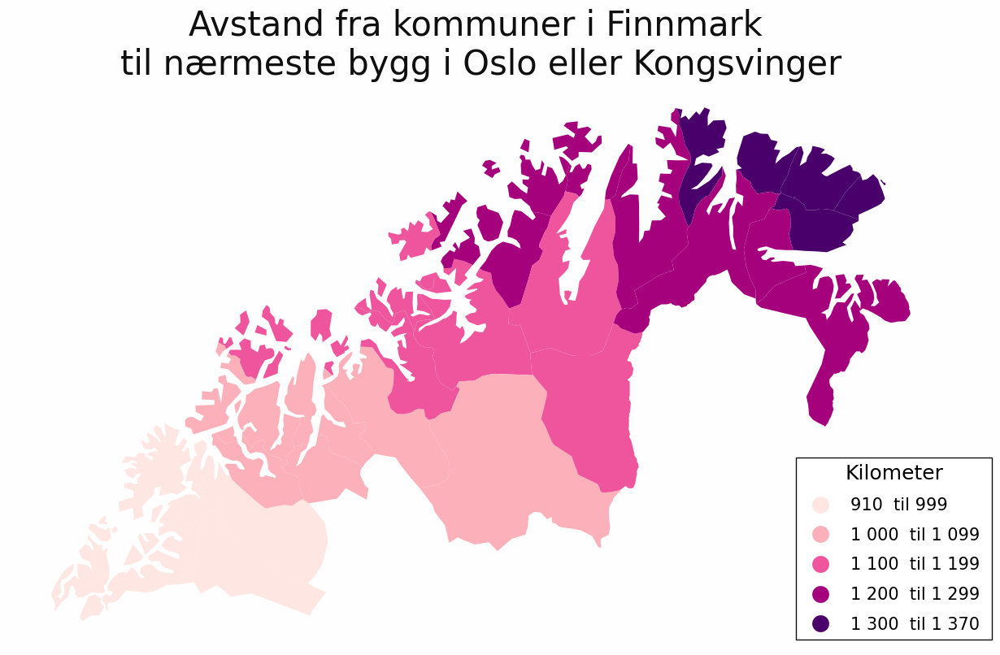

In [29]:
m = sg.ThematicMap(koblet_motsatt, column="km_til_bygg", size=15)

m.bins = [999, 1099, 1199, 1299]

m.title = "Avstand fra kommuner i Finnmark \ntil nærmeste bygg i Oslo eller Kongsvinger"

# tegnforklaringen
m.legend.title = "Kilometer"
m.legend.position = (0.95, 0.25)
m.legend.thousand_sep = " "
m.legend.label_sep = "til"
m.legend.pretty_labels = True

m.plot()

### Det var geopandas i grove trekk

Geopandas har nokså få GIS-funksjoner sammenlignet med GIS-programmer som ArcGIS og QGIS. 

Men så har man derimot ubegrenset med fleksibilitet til å utvide geopandas med egne funksjoner.

Et eksempel på det ligger her: https://statisticsnorway.github.io/ssb-sgis/index.html